<a href="https://colab.research.google.com/github/chetan-957/GIS/blob/main/ps2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Growth of Electric Vehicles**
This project studies the growth of electric vehicle (EV) charging stations and electric vehicles in
California counties. <br> We are analyzing how this growth relates to the increasing population and total
number of vehicles in each county. Our goal is to understand the relationship between electric vehicle adoption,
 population, vehicle population, and the availability of charging infrastructure across different areas in the state.
By exploring these factors, we can potentially predict and anticipate electric vehicle growth in the future.
<br>
<br>
<br>
<br>
<br>
Done by Sai Srija Ganapuram and Injavarapu Chetan Sai Abhishek

In [ ]:
%%capture
!pip install geopandas==1.0.1
!pip install mapclassify
!pip install reverse_geocoder
!pip install contextily
!pip install ipywidgets
!pip install ipyleaflet
!pip install folium geopandas
!pip install folium branca

In [ ]:
# All Imports
import os, zipfile #basics
import pandas as pd #data management
import matplotlib.pyplot as plt #vis
import csv #to read csv files
from shapely.geometry import Point
import reverse_geocoder as rg
import numpy as np
import seaborn as sns
import folium
from folium.plugins import MarkerCluster, TimestampedGeoJson, HeatMap
from folium import IFrame
from datetime import datetime
from IPython.display import display, IFrame

import geopandas as gpd #gis/maps: a sister of pandas; does the job;

import mapclassify #need for thematic map classification
import ipywidgets as widgets
from ipyleaflet import Map, basemap_to_tiles, GeoJSON
from ipywidgets import interact
from shapely.geometry import Point

#will display all output not just last command
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

from google.colab import files #to download from colab onto hd

from google.colab import data_table
data_table.enable_dataframe_formatter()
import matplotlib.colors as mcolors
from sklearn.preprocessing import KBinsDiscretizer
import contextily as ctx

In [ ]:
gpd.__version__

'1.0.1'

<Axes: >

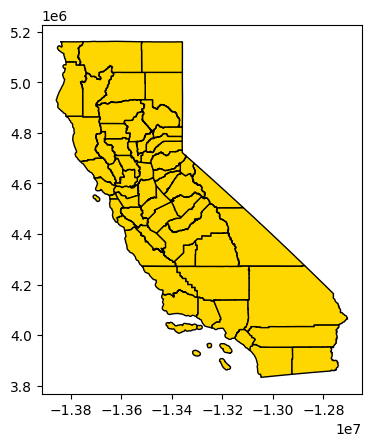

In [ ]:
! wget -q -O ca_counties.zip https://github.com/sg2083/GIS_repo/raw/main/ca_counties.zip
zip_ref = zipfile.ZipFile('ca_counties.zip', 'r')
zip_ref.extractall('California_Shape_Files') # Extract all files to a specific directory

CAl0=gpd.read_file('California_Shape_Files/CA_Counties.shp') #load the shapefile with gpd as tlC
zip_ref.close() # Close the zip file after reading the shapefile
CAl0.plot(color='gold', edgecolor='black') # Change color to lightgreen, edgecolor to black
plt.show()


In [ ]:
# Checking for the data types and checking the values of the data
CAl0.dtypes
CAl0[CAl0.columns.difference(['geometry'])].head(2)

# Selecting only Few Variables for the Table
CAl=CAl0[['NAME','NAMELSAD','Shape_Area','geometry']]

,0
STATEFP,object
COUNTYFP,object
COUNTYNS,object
GEOID,object
NAME,object
NAMELSAD,object
LSAD,object
CLASSFP,object
MTFCC,object
CSAFP,object


,ALAND,AWATER,CBSAFP,CLASSFP,COUNTYFP,COUNTYNS,CSAFP,FUNCSTAT,GEOID,INTPTLAT,INTPTLON,LSAD,METDIVFP,MTFCC,NAME,NAMELSAD,STATEFP,Shape_Area,Shape_Leng
0,2.468695e+09,23299110.0,None,H1,091,00277310,None,A,06091,+39.5769252,-120.5219926,06,None,G4020,Sierra,Sierra County,06,4.200450e+09,375602.758281
1,2.499984e+09,75425434.0,40900,H1,067,00277298,472,A,06067,+38.4500161,-121.3404408,06,None,G4020,Sacramento,Sacramento County,06,4.205516e+09,406584.174167


### **Exploring and Manipulating Population Data Of California**
taking a text file of California's population data and manipulating it to fit the structure of a pre-selected table. The goal is to ***clean, format, and align the data*** for further analysis.
Then we'll plot the latest data on the Shape File of California.

In [ ]:
#Data cleaning and merging for plotting
# Define the input file path to get the population value
! wget -q -O population_data.txt https://github.com/sg2083/GIS_repo/raw/main/population_data.txt
input_file = 'population_data.txt'

# Read the CSV data from the text file
data = []
with open(input_file, 'r') as txt_file:
    csv_reader = csv.reader(txt_file)
    headers = next(csv_reader)  # Skip the header
    for row in csv_reader:
        data.append(row)

# Convert the data into a DataFrame
df = pd.DataFrame(data, columns=['Year', 'Period', 'Area', 'Population Source', 'Population'])

# Convert Population to numeric
df['Population'] = pd.to_numeric(df['Population'].str.replace(",", ""))

# Population_of_california  the DataFrame to restructure it
POP_CAL_pivot_df = df.pivot_table(index='Area', columns='Year', values='Population')

# Rename columns for clarity (optional)
POP_CAL_pivot_df.columns = [f'Year-{col}' for col in POP_CAL_pivot_df.columns]

# Reset index to make 'Area' a column again
POP_CAL_pivot_df = POP_CAL_pivot_df.reset_index()

# Print the result
print(POP_CAL_pivot_df.head(2))

# Optionally, save the result to a CSV file
POP_CAL_pivot_df.to_csv('year-wise.csv', index=False)


             Area  Year-1995  Year-2007  Year-2018  Year-2022
0  Alameda County  1332936.0  1527809.0  1669659.0  1649975.0
1   Alpine County     1145.0     1252.0     1208.0     1175.0


After refining the dataset, we integrate it with shapefile data to create an engaging thematic map, showcasing the population distribution for 2022.

<Axes: >

[]

[]

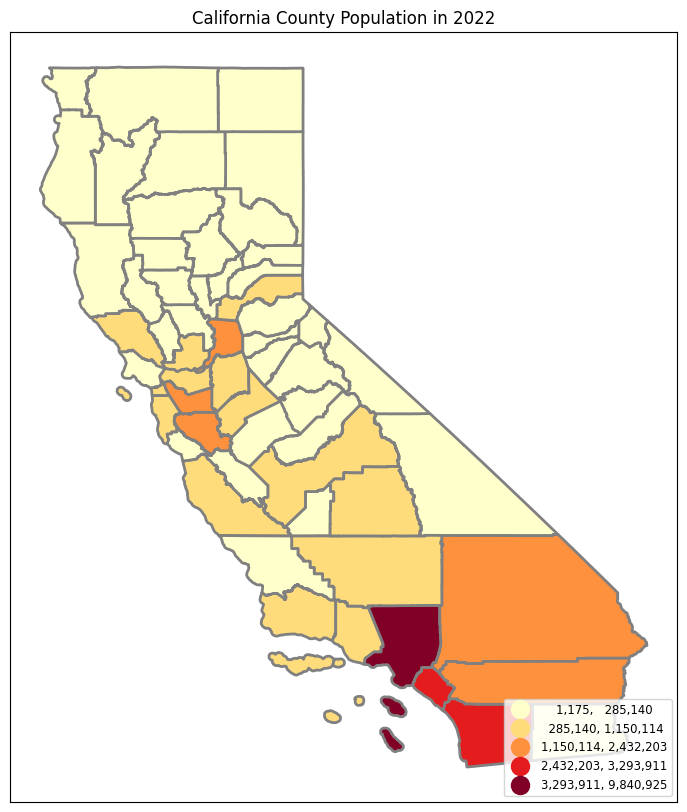

In [ ]:
# Plotting Population Data on California Map By Merging it on Basis of County
after_merge=CAl.merge(POP_CAL_pivot_df, left_on='NAMELSAD', right_on='Area',how='left')
fig, ax = plt.subplots(1, figsize=(20, 10))

after_merge.plot(ax=ax,
         column='Year-2022',         # Change this to any other year if needed (e.g., 'Year-2007','Year-2018','Year-2022' ,'Year-1995')
         legend=True,
         cmap='YlOrRd',                # Yellow to Red color gradient
         scheme='natural_breaks',    # Classify data into natural breaks (Jenks)
         k=5,                        # Number of classes
         vmin=0.1 ,
         edgecolor='grey',           # Border color for counties
         linewidth=2,                # Line width for borders
         legend_kwds={               # Customize the legend
             "fmt": "{:,.0f}",       # Format numbers with commas and no decimal points
             'loc': 'lower right',   # Legend location
             'title_fontsize': 'medium',  # Title font size for the legend
             'fontsize': 'small',         # Font size for the legend
             'markerscale': 1.4           # Scale of the markers in the legend
         })

ax.title.set_text("California County Population in 2022")

ax.set_xticks([])
ax.set_yticks([])

## **Exploring Industries Data**
We explored data from different industries to see how population and industries are connected. To do this, we made a plot showing the availability of tech and education services in each county across California

       NAME_x           NAMELSAD    Shape_Area  \
0      Sierra      Sierra County  4.200450e+09   
1  Sacramento  Sacramento County  4.205516e+09   

                                            geometry  Year-1995  Year-2007  \
0  POLYGON ((-120.6556 39.69357, -120.65554 39.69...     3527.0     3395.0   
1  POLYGON ((-121.18858 38.71431, -121.18732 38.7...  1118579.0  1411089.0   

   Year-2018  Year-2022    ID  INDTECH_CY  INDEDUC_CY  
0     3232.0     3186.0  6091          64          91  
1  1554668.0  1578644.0  6067       49679       53512  


<Axes: >

[]

[]

<Axes: >

[]

[]

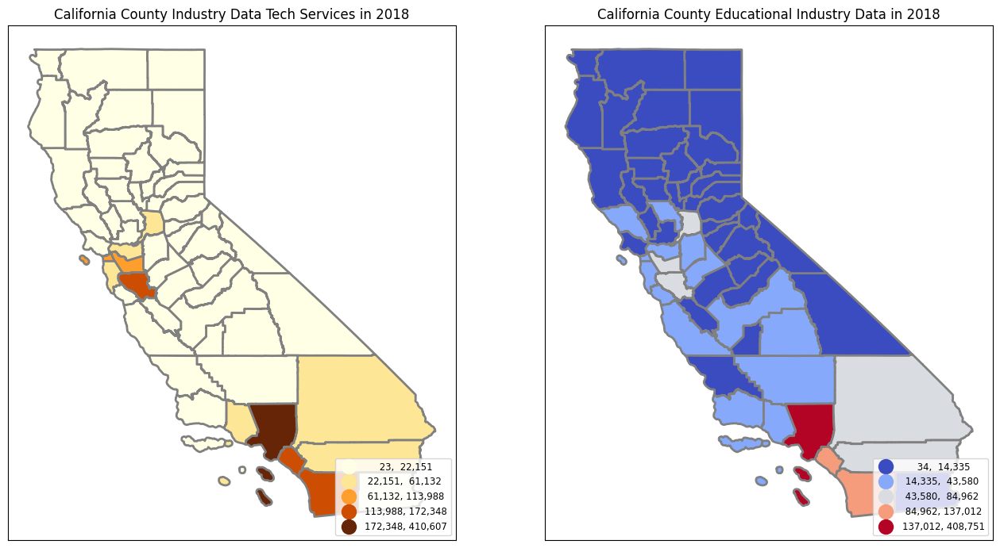

In [ ]:
! wget -q -O County_Industry_Data.csv https://github.com/sg2083/GIS_repo/raw/main/County_Industry_Data.csv

df_industry = pd.read_csv('County_Industry_Data.csv')
df_industry_filter = df_industry[df_industry['ST_ABBREV'] == 'CA']
get_df_industry = df_industry_filter[['ID','NAME','INDTECH_CY','INDEDUC_CY']]

after_merge_industry=after_merge.merge(get_df_industry, left_on='NAMELSAD', right_on='NAME',how='left')
after_merge_industry = after_merge_industry.drop(columns=['Area', 'NAME_y'])
print(after_merge_industry.head(2))

fig, ax = plt.subplots(1,2, figsize=(16, 10))

after_merge_industry.plot(ax=ax[0],
         column='INDTECH_CY',        # Change this to any other year if needed (e.g., 'Year-2007', 'Year-1995')
         legend=True,
         cmap='YlOrBr',             # Yellow to Red color gradient
         scheme='natural_breaks',    # Classify data into natural breaks (Jenks)
         k=5,                      # Number of classes
         vmin=0.1 ,
         edgecolor='grey',           # Border color for counties
         linewidth=2,                # Line width for borders
         legend_kwds={               # Customize the legend
             "fmt": "{:,.0f}",       # Format numbers with commas and no decimal points
             'loc': 'lower right',   # Legend location
             'title_fontsize': 'medium',  # Title font size for the legend
             'fontsize': 'small',         # Font size for the legend
             'markerscale': 1.4           # Scale of the markers in the legend
         })

ax[0].title.set_text("California County Industry Data Tech Services in 2018")

ax[0].set_xticks([])
ax[0].set_yticks([])

after_merge_industry.plot(ax=ax[1],
         column='INDEDUC_CY',        # Change this to any other year if needed (e.g., 'Year-2007', 'Year-1995')
         legend=True,
         cmap='coolwarm',             # Yellow to Red color gradient
         scheme='natural_breaks',    # Classify data into natural breaks (Jenks)
         k=5,                      # Number of classes
         vmin=0.1 ,
         edgecolor='grey',           # Border color for counties
         linewidth=2,                # Line width for borders
         legend_kwds={               # Customize the legend
             "fmt": "{:,.0f}",       # Format numbers with commas and no decimal points
             'loc': 'lower right',   # Legend location
             'title_fontsize': 'medium',  # Title font size for the legend
             'fontsize': 'small',         # Font size for the legend
             'markerscale': 1.4           # Scale of the markers in the legend
         })

ax[1].title.set_text("California County Educational Industry Data in 2018")

ax[1].set_xticks([])
ax[1].set_yticks([])



## **Mapping Electric Vehicle Charging Stations**
We obtained electric vehicle data that needed cleaning. Although the exact location of the charging stations wasn’t provided, we had longitude and latitude coordinates. Using this, we identified the county for each station and added that information to the data. After merging the longitude and latitude values to create the geometric points, we successfully plotted the EV stations on the map.

In [ ]:
# Reading EV Charging Station Data
! wget -q -O ev_data.csv https://github.com/sg2083/GIS_repo/raw/main/ev_data.csv
ev_data = pd.read_csv('ev_data.csv')
ev_data.head(10)

,X,Y,OBJECTID_1,StationDesignation,FuelTypeCode,StationName,StreetAddress,IntersectionDirections,City_1,State,...,EVWorkplaceCharging,EVTotalPortCountBeta,EVCHAdeMOPortCountBeta,EVJ1772PortCountBeta,EVCCSPortCountBeta,EVNEMA1450PortCountBeta,EVNEMA515PortCountBeta,EVNEMA520PortCountBeta,EVTeslaPortCountBeta,EVCCS150pluskWPortCountBeta
0,-170926.820341,98037.146589,1,NEVI Compliant,ELEC,America's Best Value Inn,3930 County Road 89,NaN,Dunnigan,CA,...,False,4,1,0,4,0,0,0,0,4
1,-162082.004149,-33590.692802,2,NEVI Compliant,ELEC,San Francisco Premium Outlets,2774 Livermore Outlets Dr.,NaN,Livermore,CA,...,False,10,1,0,10,0,0,0,0,10
2,154228.858624,-423885.300851,3,NEVI Compliant,ELEC,"Walmart 5686 - Burbank, CA",1301 N. Victory Place,NaN,Burbank,CA,...,False,10,1,0,10,0,0,0,0,10
3,-348792.844526,425087.789360,4,NEVI Compliant,ELEC,"Walmart 1910 - Crescent City, CA",900 East Washington Blvd,NaN,Crescent City,CA,...,False,4,1,0,4,0,0,0,0,4
4,226333.774936,-435004.773986,5,NEVI Compliant,ELEC,Ontario Mills,950 Ontario Mills Dr,NaN,Ontario,CA,...,False,8,1,0,8,0,0,0,0,7
5,-77038.448799,-56121.321146,6,NEVI Compliant,ELEC,"Walmart 1963 - Turlock, CA",2111 Fulkerth Road,NaN,Turlock,CA,...,False,4,1,0,4,0,0,0,0,4
6,-220477.605888,412171.502967,7,NEVI Compliant,ELEC,"Walmart 1630 - Yreka, CA",1906 Fort Jones Road,NaN,Yreka,CA,...,False,4,1,0,4,0,0,0,0,4
7,349443.729361,-467893.828273,8,NEVI Compliant,ELEC,"Walmart 2181 - Indio, CA",82-491 Avenue 42,NaN,Indio,CA,...,False,4,1,0,4,0,0,0,0,4
8,-167743.992174,-65355.142328,9,NEVI Compliant,ELEC,Great Mall,447 Great Mall Drive,NaN,Milpitas,CA,...,False,4,1,0,4,0,0,0,0,4
9,184130.798654,-472493.733138,10,NEVI Compliant,ELEC,Westminster Mall,75 Westminster Mall,NaN,Westminster,CA,...,False,4,1,0,4,0,0,0,0,4


In [ ]:
# Function to get county name
def get_county_from_lat_lon(lat, lon):
    coordinates = (lat, lon)
    result = rg.search(coordinates)  # Returns a list of dictionaries
    return result[0]['admin2']

# Apply the function to each row
for index, row in ev_data.iterrows():
    ev_data.loc[index, 'County'] = get_county_from_lat_lon(row['Latitude'], row['Longitude'])

#  Updated ev_data with county information
ev_data.to_csv('ev_data_with_county.csv', index=False)


In [ ]:
ev_data_with_county = pd.read_csv('ev_data_with_county.csv')
ev_data_with_county.head(3)

,X,Y,OBJECTID_1,StationDesignation,FuelTypeCode,StationName,StreetAddress,IntersectionDirections,City_1,State,...,EVTotalPortCountBeta,EVCHAdeMOPortCountBeta,EVJ1772PortCountBeta,EVCCSPortCountBeta,EVNEMA1450PortCountBeta,EVNEMA515PortCountBeta,EVNEMA520PortCountBeta,EVTeslaPortCountBeta,EVCCS150pluskWPortCountBeta,County
0,-170926.820341,98037.146589,1,NEVI Compliant,ELEC,America's Best Value Inn,3930 County Road 89,NaN,Dunnigan,CA,...,4,1,0,4,0,0,0,0,4,Yolo County
1,-162082.004149,-33590.692802,2,NEVI Compliant,ELEC,San Francisco Premium Outlets,2774 Livermore Outlets Dr.,NaN,Livermore,CA,...,10,1,0,10,0,0,0,0,10,Alameda County
2,154228.858624,-423885.300851,3,NEVI Compliant,ELEC,"Walmart 5686 - Burbank, CA",1301 N. Victory Place,NaN,Burbank,CA,...,10,1,0,10,0,0,0,0,10,Los Angeles County


<Axes: >

<Axes: >

<Axes: >

Text(0.5, 1.0, 'EV Charging Stations by County')

Text(0.5, 80.7222222222222, 'Longitude')

Text(144.61080201807664, 0.5, 'Latitude')

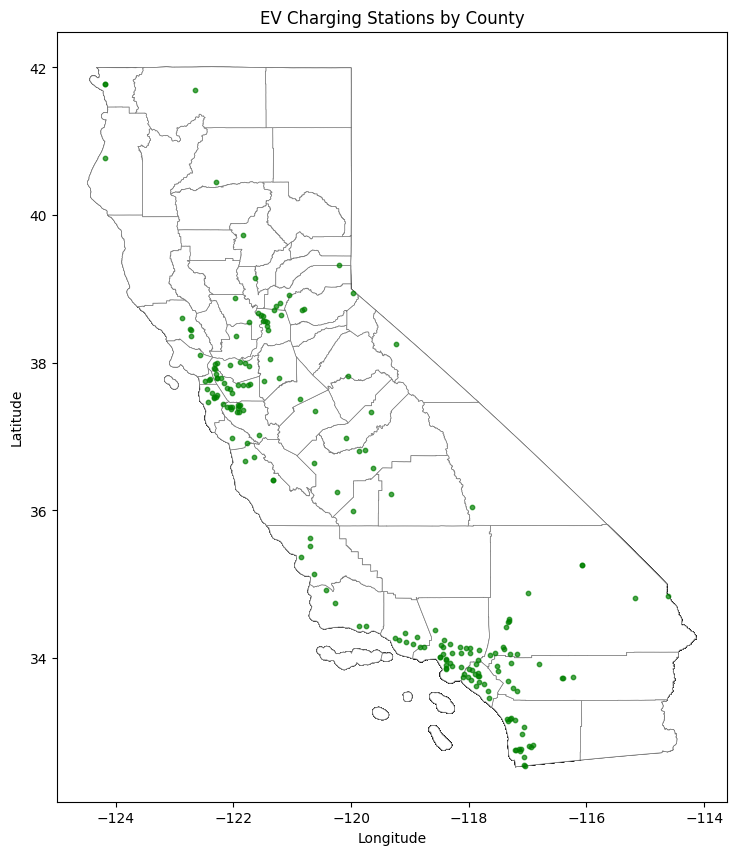

In [ ]:
# Create a GeoDataFrame with geometry for EV stations
ev_gdf = gpd.GeoDataFrame(
    ev_data_with_county,
    geometry=gpd.points_from_xy(ev_data_with_county.Longitude, ev_data_with_county.Latitude)
)

# Explicitly set the CRS of ev_gdf to match tlC0 - replace 'epsg:xxxx' with the actual EPSG code
ev_gdf = ev_gdf.set_crs("epsg:4326")
after_merge = after_merge.to_crs("epsg:4326")


merged_data = after_merge.merge(ev_data_with_county, left_on='NAMELSAD', right_on='County', how='left')
# Create a plot
fig, ax = plt.subplots(figsize=(10, 10))

# Plot the county boundaries
merged_data = merged_data.set_geometry('geometry') # Set the active geometry column to county boundaries
merged_data.plot(ax=ax, color='lightgray', edgecolor='black', linewidth=0.5)

after_merge.plot(ax=ax, color='white', edgecolor='grey', linewidth=0.5)
# Plot the EV locations using the ev_gdf GeoDataFrame
ev_gdf.plot(ax=ax, marker='o', color='Green', markersize=10, alpha=0.7)

# Set plot title and labels
plt.title('EV Charging Stations by County')
plt.xlabel('Longitude')
plt.ylabel('Latitude')

# Show the plot
plt.show()

## **Analyzing Electric Vehicle Distribution and Charging Station Accessibility in California**
We analyzed EV data across California and visualized it. Next, we layered the locations of charging stations and EVs on the map to see if the stations are placed where they’re most needed.

In [ ]:
# Load the vehicle population data from the Excel file
! wget -q -O vehicle_pop.xlsx https://github.com/sg2083/GIS_repo/raw/main/vehicle_pop.xlsx
vehicle_pop = pd.read_excel('vehicle_pop.xlsx', sheet_name='County')

# Define a reusable function to filter, group, and pivot data for a given year
def process_vehicle_data(df, year):
    # Filter data by year and fuel types
    filtered_df = df[(df['Data Year'] == year) &
                     (df['Fuel Type'].isin(['Battery Electric (BEV)', 'Plug-in Hybrid (PHEV)']))]

    # Group by county and fuel type and sum the vehicle counts
    county_fuel_count = filtered_df.groupby(['County', 'Fuel Type'])['Number of Vehicles'].sum().reset_index()

    # Pivot the table for better readability
    county_fuel_pivot = county_fuel_count.pivot(index='County', columns='Fuel Type', values='Number of Vehicles').reset_index()

    # Fill NaN values with 0
    county_fuel_pivot = county_fuel_pivot.fillna(0)

    return county_fuel_pivot

# Process data for each year
county_fuel_2023 = process_vehicle_data(vehicle_pop, 2023)
county_fuel_2010 = process_vehicle_data(vehicle_pop, 2010)
county_fuel_2017 = process_vehicle_data(vehicle_pop, 2017)

# Add a new column 'Total' for the sum of BEV and PHEV for each year
county_fuel_2023['Total_EV_Vehicles_2023'] = (county_fuel_2023['Battery Electric (BEV)'] +
                                              county_fuel_2023['Plug-in Hybrid (PHEV)'])

county_fuel_2010['Total_EV_Vehicles_2010'] = (county_fuel_2010['Battery Electric (BEV)'] +
                                              county_fuel_2010['Plug-in Hybrid (PHEV)'])

county_fuel_2017['Total_EV_Vehicles_2017'] = (county_fuel_2017['Battery Electric (BEV)'] +
                                              county_fuel_2017['Plug-in Hybrid (PHEV)'])

# Merge the data from all years into a single DataFrame
county_fuel_combined = county_fuel_2023[['County', 'Total_EV_Vehicles_2023']].merge(
    county_fuel_2010[['County', 'Total_EV_Vehicles_2010']], on='County', how='left').merge(
    county_fuel_2017[['County', 'Total_EV_Vehicles_2017']], on='County', how='left')

# Replace any remaining NaN values with 0
county_fuel_combined = county_fuel_combined.fillna(0)

# Convert only numeric columns to integers, excluding 'County'
numeric_columns = county_fuel_combined.select_dtypes(include=['float', 'int']).columns
county_fuel_combined[numeric_columns] = county_fuel_combined[numeric_columns].astype(int)

# Print the result
county_fuel_combined[['Total_EV_Vehicles_2010', 'Total_EV_Vehicles_2017', 'Total_EV_Vehicles_2023']].head(3)


Fuel Type,Total_EV_Vehicles_2010,Total_EV_Vehicles_2017,Total_EV_Vehicles_2023
0,20,24758,96382
1,0,3,32
2,1,92,536


After filtering the dataset to focus on the counts of electric vehicles (EVs) for the years 2010, 2017, and 2023, I aimed to visualize the growth in EV adoption over this period. By creating side-by-side plots for each of these years, I intended to provide a clear comparison that highlights the increase in vehicle counts. This approach allows for a straightforward visual analysis, making it easier to observe trends and changes in EV numbers over time. The resulting plots serve as an effective tool to illustrate the progress in electric vehicle usage, reflecting broader trends in sustainability and transportation technology.

<Axes: >

Text(0.5, 1.0, 'Total BEV and PHEV Vehicles by County (2010)')

<Axes: >

Text(0.5, 1.0, 'Total BEV and PHEV Vehicles by County (2017)')

<Axes: >

Text(0.5, 1.0, 'Total BEV and PHEV Vehicles by County (2023)')

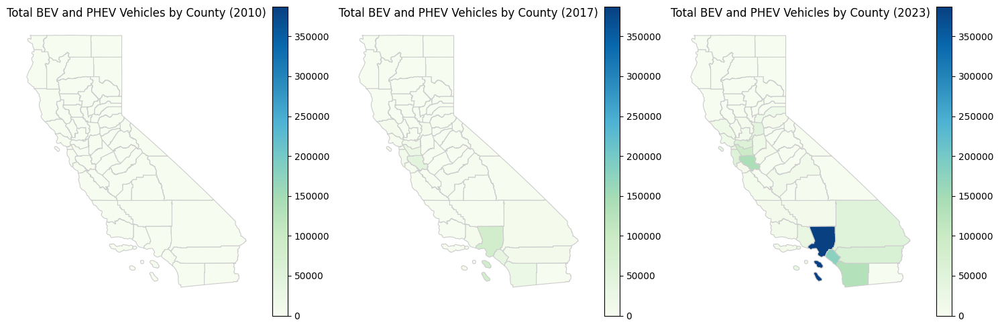

In [ ]:
# Merging the datasets
merged_data = after_merge.merge(county_fuel_combined, left_on='NAME', right_on='County', how='left')

# Find the overall min and max values for color scale consistency
vmin = merged_data[['Total_EV_Vehicles_2010', 'Total_EV_Vehicles_2017', 'Total_EV_Vehicles_2023']].min().min()
vmax = merged_data[['Total_EV_Vehicles_2010', 'Total_EV_Vehicles_2017', 'Total_EV_Vehicles_2023']].max().max()

# Create a figure with 3 subplots
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

# Plot for 2010
merged_data.plot(column='Total_EV_Vehicles_2010',
                 cmap='GnBu',
                 linewidth=0.8,
                 edgecolor='0.8',
                 legend=True,
                 ax=axes[0],
                 vmin=vmin,  # Consistent color scale
                 vmax=vmax,  # Consistent color scale
                 missing_kwds={'color': 'lightgrey'})
axes[0].set_title('Total BEV and PHEV Vehicles by County (2010)')
axes[0].set_axis_off()  # Turn off the axis for better map presentation

# Plot for 2017
merged_data.plot(column='Total_EV_Vehicles_2017',
                 cmap='GnBu',
                 linewidth=0.8,
                 edgecolor='0.8',
                 legend=True,
                 ax=axes[1],
                 vmin=vmin,
                 vmax=vmax,
                 missing_kwds={'color': 'lightgrey'})
axes[1].set_title('Total BEV and PHEV Vehicles by County (2017)')
axes[1].set_axis_off()

# Plot for 2023
merged_data.plot(column='Total_EV_Vehicles_2023',
                 cmap='GnBu',
                 linewidth=0.8,
                 edgecolor='0.8',
                 legend=True,
                 ax=axes[2],
                 vmin=vmin,
                 vmax=vmax,
                 missing_kwds={'color': 'lightgrey'})
axes[2].set_title('Total BEV and PHEV Vehicles by County (2023)')
axes[2].set_axis_off()

plt.tight_layout()  # Adjust spacing between subplots
plt.show()

<Axes: >

<Axes: >

Text(0.5, 1.0, 'Total BEV and PHEV Vehicles by County and EV Charging Stations Available')

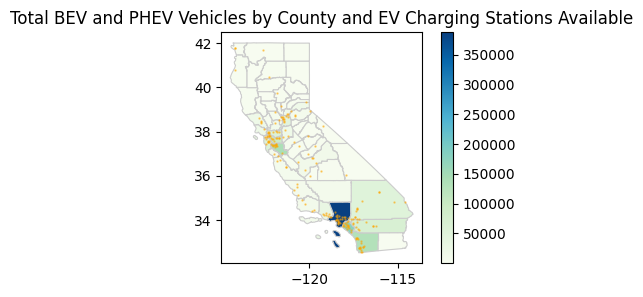

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(5, 3))
merged_data.plot(column='Total_EV_Vehicles_2023',
                cmap='GnBu',
                linewidth=0.8,
                edgecolor='0.8',
                legend=True,
                ax=ax,
                missing_kwds={'color': 'lightgrey'})

ev_gdf.plot(ax=ax, marker='o', color='Orange', markersize=0.5, alpha=0.5)

ax.set_title('Total BEV and PHEV Vehicles by County and EV Charging Stations Available')
plt.show()


<Axes: >

<Axes: >

Text(0.5, 1.0, 'Total BEV and PHEV Vehicles by County and Population Density of 2022')

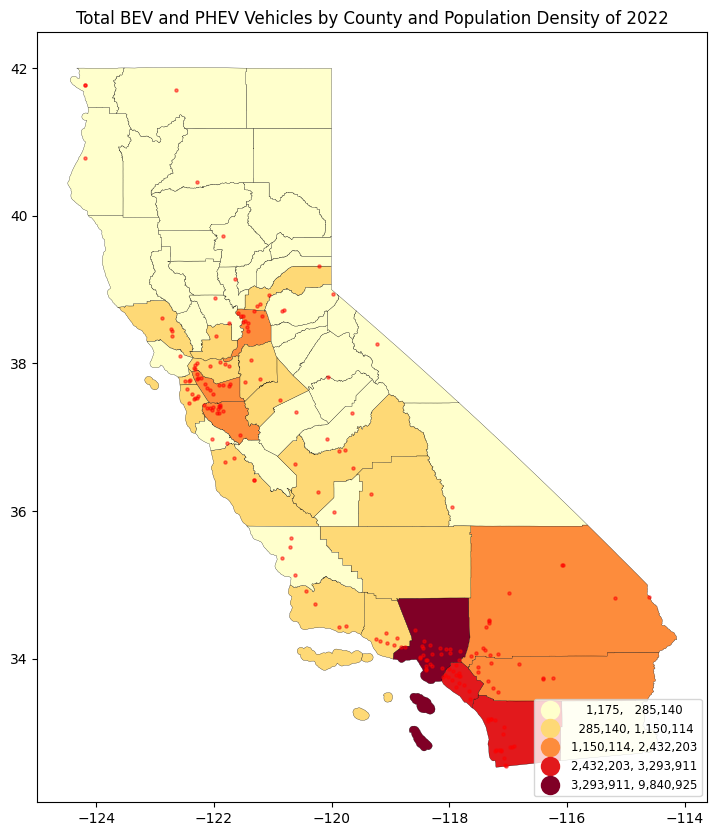

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(15, 10))
merged_data.plot(
                column='Year-2022',
                cmap='YlOrRd',
                linewidth=0.2,
                edgecolor='black',
                scheme='natural_breaks',
                legend=True,
                ax=ax,
                k=5,
                missing_kwds={'color': 'lightgrey'},
                legend_kwds={                # Customize the legend
                "fmt": "{:,.0f}",               # Format numbers with commas and no decimal points
                'loc': 'lower right',           # Legend location
                'title_fontsize': 'medium',     # Title font size for the legend
                'fontsize': 'small',             # Font size for the legend
                'markerscale': 1.4     }
                 )
ev_gdf.plot(ax=ax, marker='o', color='red', markersize=5, alpha=0.5)

ax.set_title('Total BEV and PHEV Vehicles by County and Population Density of 2022')
plt.show()

In [ ]:
# Assuming 'merged_data' is your GeoDataFrame with county boundaries and EV data
merged_data['centroid'] = merged_data.geometry.centroid

# Print the updated GeoDataFrame
print(merged_data.head(2))  # Display the first two rows to verify centroid calculation

         NAME           NAMELSAD    Shape_Area  \
0      Sierra      Sierra County  4.200450e+09   
1  Sacramento  Sacramento County  4.205516e+09   

                                            geometry               Area  \
0  POLYGON ((-120.6556 39.69357, -120.65554 39.69...      Sierra County   
1  POLYGON ((-121.18858 38.71431, -121.18732 38.7...  Sacramento County   

   Year-1995  Year-2007  Year-2018  Year-2022      County  \
0     3527.0     3395.0     3232.0     3186.0      Sierra   
1  1118579.0  1411089.0  1554668.0  1578644.0  Sacramento   

   Total_EV_Vehicles_2023  Total_EV_Vehicles_2010  Total_EV_Vehicles_2017  \
0                      25                       0                       3   
1                   44660                       6                    6860   

                      centroid  
0  POINT (-120.51601 39.58041)  
1  POINT (-121.34427 38.44933)  


<ipython-input-191-1f224dceb9d3>:2: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  merged_data['centroid'] = merged_data.geometry.centroid



we are visualizing electric vehicle (EV) data for the year 2023 by plotting county boundaries and their centroids on a map. First, we create a figure and axis for our plot, then render the county boundaries in beige with black edges for clarity. Next, we define a custom colormap for better visual representation of the EV data, specifically adjusting it to start from a lighter shade. We then plot the centroids of each county, using the total number of EVs from 2017 to determine the color intensity of the markers, making it easier to identify areas with higher vehicle counts. The plot is enhanced with a title and labeled axes, ultimately providing insights into the distribution of EVs across different regions. This visual analysis helps us observe patterns in EV adoption over time.

<Axes: >

<ipython-input-192-25c4a8b2dbb7>:10: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap('Reds')  # Get the 'Reds' colormap


<Axes: >

Text(0.5, 1.0, 'EV Data 2023 by Centroid')

Text(0.5, 25.722222222222214, 'Longitude')

Text(56.35726301173543, 0.5, 'Latitude')

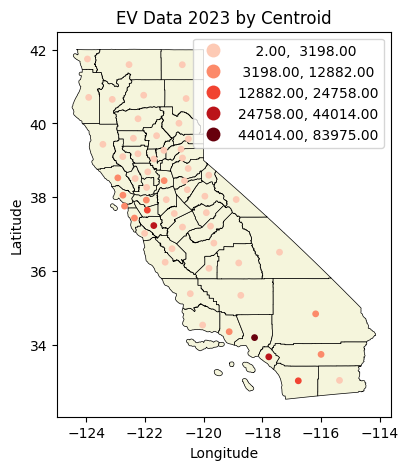

In [ ]:
fig, ax = plt.subplots(figsize=(5, 5))

# Plot the county boundaries with a specific color
merged_data.plot(ax=ax, color='beige', edgecolor='black', linewidth=0.5)

# # Plot the centroids
# merged_data.plot(ax=ax, column='Total_EV_Vehicles', marker='o', markersize=10, cmap='Reds', legend=True, scheme='natural_breaks')

# Create a custom colormap with a modified minimum color
cmap = plt.cm.get_cmap('Reds')  # Get the 'Reds' colormap
new_cmap = cmap(np.linspace(0.2, 1, cmap.N))  # Start from 0.2 instead of 0
new_cmap = mcolors.ListedColormap(new_cmap)  # Create a new colormap

# Plot the centroids using 'Total_EV_Vehicles' for color variation
merged_data.set_geometry(merged_data['centroid']).plot(
    ax=ax,
    column='Total_EV_Vehicles_2017',
    marker='o',
    markersize=15,
    cmap=new_cmap,  # Use a colormap for color variation
    legend=True,
    scheme='natural_breaks',
)



# Set plot title and labels
plt.title('EV Data 2023 by Centroid')
plt.xlabel('Longitude')
plt.ylabel('Latitude')

# Show the plot
plt.show()

#**Air Quality Index of 2010 , 2017 and 2023**
This code starts by downloading air quality data for the years 2010, 2017, and 2023 from specific online sources. Once the data is in hand, it defines a function that processes this information: it reads each CSV file, groups the data by county, calculates the average daily PM2.5 concentrations and Air Quality Index (AQI) values, and renames the columns to make them clearer. After processing the data for all three years, the code merges these datasets based on the 'County' column, resulting in a comprehensive table that captures air quality metrics for each county across the different years.

Following that, the code combines this air quality data with existing electric vehicle (EV) information. This merging allows us to analyze how air quality relates to the number of electric vehicles in each county. To visualize this relationship, the code creates histograms showing the distribution of AQI levels for each year. Each histogram represents the frequency of counties at different AQI levels, using distinct colors to make the data easy to interpret. This visual approach helps us spot trends and patterns in air quality over time, enhancing our understanding of how air pollution might connect with the adoption of electric vehicles. Finally, the layout of the plots is adjusted for a polished presentation, and the histograms are displayed for viewing.

In [ ]:
! wget -q -O air_quality_PM_2010.csv https://github.com/sg2083/GIS_repo/raw/main/air_quality_PM_2010.csv
! wget -q -O air_quality_PM_2017.csv https://github.com/sg2083/GIS_repo/raw/main/air_quality_PM_2017.csv
! wget -q -O air_quality_PM_2023.csv https://github.com/sg2083/GIS_repo/raw/main/air_quality_PM_2023.csv
data = pd.read_csv('air_quality_PM_2010.csv')

# Function to load, group by 'County', calculate mean, round values, and rename columns
def process_data(file_path, year):
    data = pd.read_csv(file_path)
    county_grouped = data.groupby('County').mean(numeric_only=True).round(2)
    county_grouped = county_grouped.rename(columns={
        'Daily Mean PM2.5 Concentration': f'Mean PM2.5_{year}',
        'Daily AQI Value': f'Mean AQI_{year}'
    })
    return county_grouped

# Process data for 2010, 2017, and 2023
county_grouped_2010 = process_data('air_quality_PM_2010.csv', 2010)
county_grouped_2017 = process_data('air_quality_PM_2017.csv', 2017)
county_grouped_2023 = process_data('air_quality_PM_2023.csv', 2023)

# Merge data for all years on 'County'
merged_air_data = county_grouped_2010[['Site ID', f'Mean PM2.5_2010', f'Mean AQI_2010', 'Site Latitude', 'Site Longitude']].merge(
    county_grouped_2017[[f'Mean PM2.5_2017', f'Mean AQI_2017']], on='County', how='inner'
).merge(
    county_grouped_2023[[f'Mean PM2.5_2023', f'Mean AQI_2023']], on='County', how='inner'
)

# Display the merged table with data from 2010, 2017, and 2023
merged_air_data.head()

,Site ID,Mean PM2.5_2010,Mean AQI_2010,Site Latitude,Site Longitude,Mean PM2.5_2017,Mean AQI_2017,Mean PM2.5_2023,Mean AQI_2023
County,,,,,,,,,
Alameda,60010567.39,8.17,40.08,37.74,-122.10,10.32,46.10,7.01,35.24
Butte,60072803.44,8.78,42.33,39.50,-121.69,9.98,44.19,7.13,35.64
Calaveras,60090001.00,7.38,39.41,38.20,-120.68,13.38,58.45,5.54,29.12
Colusa,60111002.00,6.05,31.53,39.19,-122.00,6.32,29.50,9.80,45.64
Contra Costa,60130002.00,7.61,36.35,37.94,-122.03,11.44,51.09,7.86,38.93


In [ ]:
# Merge EV data with the previously merged air quality data on 'County'
merged_ev_data = merged_air_data.merge(merged_data[['County', 'Total_EV_Vehicles_2023', 'Total_EV_Vehicles_2017', 'Total_EV_Vehicles_2010']], on='County', how='inner')

# Display the merged data with EV population
merged_ev_data.head()

,County,Site ID,Mean PM2.5_2010,Mean AQI_2010,Site Latitude,Site Longitude,Mean PM2.5_2017,Mean AQI_2017,Mean PM2.5_2023,Mean AQI_2023,Total_EV_Vehicles_2023,Total_EV_Vehicles_2017,Total_EV_Vehicles_2010
0,Alameda,60010567.39,8.17,40.08,37.74,-122.10,10.32,46.10,7.01,35.24,96382,24758,20
1,Butte,60072803.44,8.78,42.33,39.50,-121.69,9.98,44.19,7.13,35.64,2369,395,0
2,Calaveras,60090001.00,7.38,39.41,38.20,-120.68,13.38,58.45,5.54,29.12,702,115,0
3,Colusa,60111002.00,6.05,31.53,39.19,-122.00,6.32,29.50,9.80,45.64,129,12,0
4,Contra Costa,60130002.00,7.61,36.35,37.94,-122.03,11.44,51.09,7.86,38.93,58184,12882,10


(array([3., 0., 3., 0., 0., 1., 0., 0., 2., 2., 1., 2., 6., 5., 7., 2., 2.,
        2., 2., 3., 2., 2., 0., 1., 0., 0., 1., 0., 0., 1.]),
 array([11.08 , 13.121, 15.162, 17.203, 19.244, 21.285, 23.326, 25.367,
        27.408, 29.449, 31.49 , 33.531, 35.572, 37.613, 39.654, 41.695,
        43.736, 45.777, 47.818, 49.859, 51.9  , 53.941, 55.982, 58.023,
        60.064, 62.105, 64.146, 66.187, 68.228, 70.269, 72.31 ]),
 <BarContainer object of 30 artists>)

Text(0.5, 0, 'AQI Levels')

Text(0, 0.5, 'Frequency of Counties')

Text(0.5, 1.0, 'AQI Levels Distribution (2010)')

(array([1., 1., 0., 0., 2., 1., 1., 2., 3., 1., 3., 0., 0., 0., 2., 2., 3.,
        5., 3., 5., 0., 1., 4., 4., 2., 0., 0., 1., 2., 1.]),
 array([17.2  , 18.664, 20.128, 21.592, 23.056, 24.52 , 25.984, 27.448,
        28.912, 30.376, 31.84 , 33.304, 34.768, 36.232, 37.696, 39.16 ,
        40.624, 42.088, 43.552, 45.016, 46.48 , 47.944, 49.408, 50.872,
        52.336, 53.8  , 55.264, 56.728, 58.192, 59.656, 61.12 ]),
 <BarContainer object of 30 artists>)

Text(0.5, 0, 'AQI Levels')

Text(0, 0.5, 'Frequency of Counties')

Text(0.5, 1.0, 'AQI Levels Distribution (2017)')

(array([2., 1., 1., 0., 0., 1., 1., 0., 4., 3., 1., 1., 3., 1., 5., 1., 4.,
        1., 0., 2., 2., 3., 1., 1., 2., 2., 2., 3., 1., 1.]),
 array([19.62      , 20.58966667, 21.55933333, 22.529     , 23.49866667,
        24.46833333, 25.438     , 26.40766667, 27.37733333, 28.347     ,
        29.31666667, 30.28633333, 31.256     , 32.22566667, 33.19533333,
        34.165     , 35.13466667, 36.10433333, 37.074     , 38.04366667,
        39.01333333, 39.983     , 40.95266667, 41.92233333, 42.892     ,
        43.86166667, 44.83133333, 45.801     , 46.77066667, 47.74033333,
        48.71      ]),
 <BarContainer object of 30 artists>)

Text(0.5, 0, 'AQI Levels')

Text(0, 0.5, 'Frequency of Counties')

Text(0.5, 1.0, 'AQI Levels Distribution (2023)')

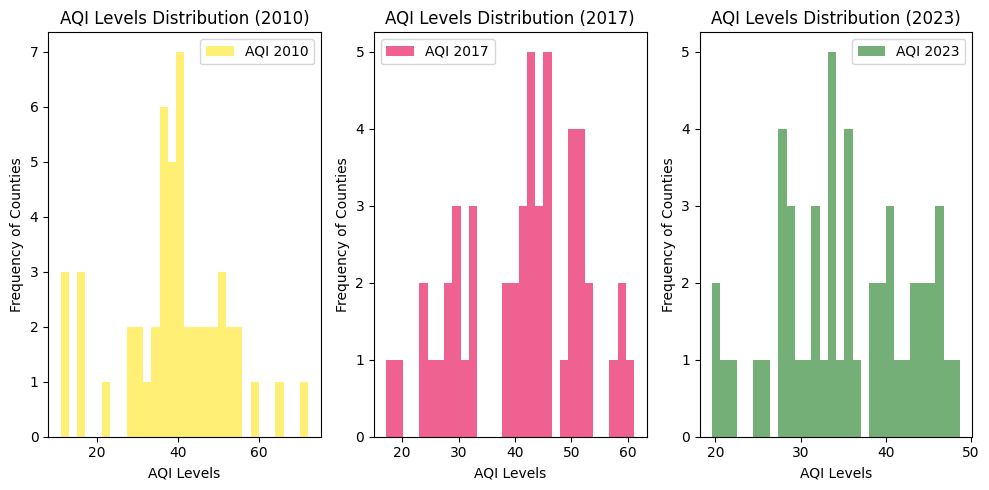

In [ ]:
fig, axes = plt.subplots(1, 3, figsize=(10, 5))

# Plot histogram for AQI levels in 2010 and 2017 on the left
axes[0].hist(merged_ev_data['Mean AQI_2010'], bins=30, alpha=0.7, label='AQI 2010', color='#ffeb3b')  # Yellow
axes[0].set_xlabel('AQI Levels')
axes[0].set_ylabel('Frequency of Counties')
axes[0].set_title('AQI Levels Distribution (2010)')
axes[0].legend()

# Plot histogram for AQI levels in 2017 and 2023 on the right
axes[1].hist(merged_ev_data['Mean AQI_2017'], bins=30, alpha=0.7, label='AQI 2017', color='#e91e63')  # Pink
axes[1].set_xlabel('AQI Levels')
axes[1].set_ylabel('Frequency of Counties')
axes[1].set_title('AQI Levels Distribution (2017)')
axes[1].legend()

axes[2].hist(merged_ev_data['Mean AQI_2023'], bins=30, alpha=0.7, label='AQI 2023', color='#388e3c')  # Dark Green
axes[2].set_xlabel('AQI Levels')
axes[2].set_ylabel('Frequency of Counties')
axes[2].set_title('AQI Levels Distribution (2023)')
axes[2].legend()
# Adjust layout to prevent overlapping
plt.tight_layout()

# Show the plot
plt.show()

derive PM2.5 pollutant from the data and plotting it on the graph. Cuz we are studying about EV vechiles and PM2.5 is related to vechile emmision pollutatant that has to be reduced  

#**Analysis of air Pollutents related to vechicles**
pollution and PM2.5 pollunent data
ChatGPT said:
ChatGPT
As a next step, we focus on visualizing PM2.5 pollutant levels to understand their relationship with electric vehicle (EV) emissions. PM2.5, fine particulate matter that can penetrate deep into the lungs, is a significant air pollutant associated with various health issues and environmental concerns. Monitoring its levels is crucial, especially as we study the impact of vehicle emissions on air quality. This plot displays the mean PM2.5 concentrations across different counties for the years 2010, 2017, and 2023. Using line plots for each year, distinct colors enhance clarity. The x-axis represents the counties, while the y-axis shows the mean PM2.5 concentrations. The visualization includes a title, axis labels, and a legend for easy interpretation. By illustrating trends in PM2.5 levels over time, this analysis highlights the importance of reducing vehicle emissions to improve air quality and public heal

<Figure size 1400x800 with 0 Axes>

Text(0.5, 1.0, 'Mean PM2.5 Concentration Across Counties (2010, 2017, 2023)')

Text(0.5, 0, 'County')

Text(0, 0.5, 'Mean PM2.5 Concentration')

([0,
  1,
  2,
  3,
  4,
  5,
  6,
  7,
  8,
  9,
  10,
  11,
  12,
  13,
  14,
  15,
  16,
  17,
  18,
  19,
  20,
  21,
  22,
  23,
  24,
  25,
  26,
  27,
  28,
  29,
  30,
  31,
  32,
  33,
  34,
  35,
  36,
  37,
  38,
  39,
  40,
  41,
  42,
  43,
  44,
  45,
  46,
  47,
  48,
  49],
 [Text(0, 0, 'Alameda'),
  Text(1, 0, 'Butte'),
  Text(2, 0, 'Calaveras'),
  Text(3, 0, 'Colusa'),
  Text(4, 0, 'Contra Costa'),
  Text(5, 0, 'Del Norte'),
  Text(6, 0, 'El Dorado'),
  Text(7, 0, 'Fresno'),
  Text(8, 0, 'Glenn'),
  Text(9, 0, 'Humboldt'),
  Text(10, 0, 'Imperial'),
  Text(11, 0, 'Inyo'),
  Text(12, 0, 'Kern'),
  Text(13, 0, 'Kings'),
  Text(14, 0, 'Lake'),
  Text(15, 0, 'Los Angeles'),
  Text(16, 0, 'Madera'),
  Text(17, 0, 'Marin'),
  Text(18, 0, 'Mariposa'),
  Text(19, 0, 'Mendocino'),
  Text(20, 0, 'Merced'),
  Text(21, 0, 'Mono'),
  Text(22, 0, 'Monterey'),
  Text(23, 0, 'Nevada'),
  Text(24, 0, 'Orange'),
  Text(25, 0, 'Placer'),
  Text(26, 0, 'Plumas'),
  Text(27, 0, 'Riverside

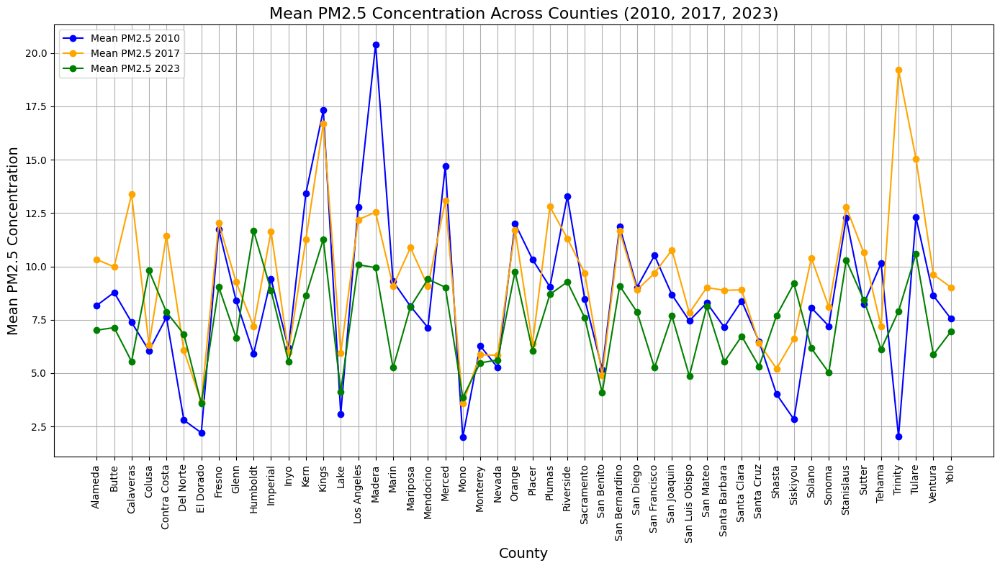

In [ ]:
# Set the figure size
plt.figure(figsize=(14, 8))

# Plot each year's PM2.5 values
plt.plot(merged_ev_data['County'], merged_ev_data['Mean PM2.5_2010'], marker='o', label='Mean PM2.5 2010', color='blue')
plt.plot(merged_ev_data['County'], merged_ev_data['Mean PM2.5_2017'], marker='o', label='Mean PM2.5 2017', color='orange')
plt.plot(merged_ev_data['County'], merged_ev_data['Mean PM2.5_2023'], marker='o', label='Mean PM2.5 2023', color='green')

# Title and labels
plt.title('Mean PM2.5 Concentration Across Counties (2010, 2017, 2023)', fontsize=16)
plt.xlabel('County', fontsize=14)
plt.ylabel('Mean PM2.5 Concentration', fontsize=14)
plt.xticks(rotation=90)  # Rotate x-axis labels for better readability
plt.legend()
plt.grid()

# Show the plot
plt.tight_layout()
plt.show()

In this next step, we create a GeoDataFrame to visualize PM2.5 pollution data using latitude and longitude coordinates. This involves constructing geometrical points for each site based on their respective coordinates and ensuring the GeoDataFrame is aligned with the correct coordinate reference system (EPSG:4326). After that, we merge this PM2.5 data with a shapefile of California counties, allowing us to map the pollution levels accurately.

Now, we study PM2.5 over the three years (2010, 2017, and 2023) and plot them on an interactive map. We define a function to visualize the PM2.5 levels for each year, using a color gradient to represent different levels of pollution. This function also adds a basemap for better context.

To enhance user interaction, an interactive slider is implemented, enabling users to choose the year they wish to explore. Additionally, we employ the Folium library to create a dynamic map that visualizes Air Quality Index (AQI) values at various locations, with markers color-coded based on the AQI level. Each marker displays relevant information about the county and AQI value when clicked.

This approach not only helps in analyzing PM2.5 data over time but also emphasizes the relationship between vehicle emissions and air quality, providing insights into the effectiveness of policies aimed at reducing pollution.

In [ ]:
# Step 3: Create a GeoDataFrame using PM2.5 data (using Lat/Lon)
geometry = [Point(xy) for xy in zip(merged_ev_data['Site Longitude'], merged_ev_data['Site Latitude'])]
gdf = gpd.GeoDataFrame(merged_ev_data, geometry=geometry)

# Ensure the GeoDataFrame is using the same CRS as the shapefile (EPSG:4326 for lat/lon)
gdf.set_crs(epsg=4326, inplace=True).head(2)

# Step 4: Merge PM2.5 data with California shapefile based on county name
gdf_county = gdf.merge(merged_ev_data, left_on='County', right_on='County')

# Define a function to plot the PM2.5 data with time slider and basemap
def plot_map(year):
    # Map the PM2.5 values based on the selected year
    if year == 2010:
        gdf_county.plot(column='Mean PM2.5_2010_x', cmap='coolwarm', figsize=(6, 6), legend=True)
        plt.title('Mean PM2.5 Levels (2010)')
    elif year == 2017:
        gdf_county.plot(column='Mean PM2.5_2017_x', cmap='coolwarm', figsize=(6, 6), legend=True)
        plt.title('Mean PM2.5 Levels (2017)')
    elif year == 2023:
        gdf_county.plot(column='Mean PM2.5_2023_x', cmap='coolwarm', figsize=(6, 6), legend=True)
        plt.title('Mean PM2.5 Levels (2023)')

    # Add basemap using contextily
    ctx.add_basemap(plt.gca(), crs=gdf_county.crs.to_string(), source=ctx.providers.OpenStreetMap.Mapnik)
    plt.show()

# Step 6: Interactive map with time slider
interact(plot_map, year=widgets.IntSlider(min=2010, max=2023, step=7, value=2010))

import folium
from folium.plugins import MarkerCluster, TimestampedGeoJson
import pandas as pd
from datetime import datetime
import branca.colormap as cm


map_center = [36.7783, -119.4179]  # Center for California

# Helper function to determine circle color based on AQI value
def get_color(aqi):
  aqi = round(float(aqi), 2)

  if aqi <= 50:
    return 'green'
  elif 50 <= aqi and aqi <= 100:
    return 'yellow'
  elif 101 <= aqi and aqi <= 150:
    return 'orange'
  elif 151 <= aqi and aqi <= 200:
    return 'red'
  else:
    return 'purple'

# Function to create the map and add AQI markers based on year
def create_map(year):
    m = folium.Map(location=map_center, zoom_start=6)
    marker_cluster = MarkerCluster().add_to(m)

    # Loop through the rows and add a marker for each site with the corresponding AQI
    for _, row in gdf_county.iterrows():
        lat = row['Site Latitude_x']
        lon = row['Site Longitude_x']

        # Choose the AQI value based on the selected year
        if year == 2010:
            aqi = row['Mean AQI_2010_x']
        elif year == 2017:
            aqi = row['Mean AQI_2017_x']
        else:  # Year 2023
            aqi = row['Mean AQI_2023_x']

        # Define the marker properties
        color = get_color(aqi)
        text_color = 'black' if color == 'yellow' else 'white'

        popup = f"County: {row['County']}<br>AQI: {aqi}<br>Year: {year}"

        # Add the marker with AQI value on the popup
        folium.Marker(
            location=[lat, lon],
            popup=popup,
            icon=folium.DivIcon(
                html=f'''<div style="font-size: 8pt; color: {text_color}; font-weight: bold; background-color: {color}; padding:5px; border-radius: 50%; width: 27px; width: 27px;
        height: 27px;
        display: flex;
        align-items: center;
        justify-content: center;
        text-align: center;
        ">{aqi}</div>'''
            )
        ).add_to(marker_cluster)

    # Show the map
    return m

# Use ipywidgets to create a dropdown or slider to select the year
interact(create_map, year=widgets.IntSlider(min=2010, max=2023, step=7, value=2010))


,County,Site ID,Mean PM2.5_2010,Mean AQI_2010,Site Latitude,Site Longitude,Mean PM2.5_2017,Mean AQI_2017,Mean PM2.5_2023,Mean AQI_2023,Total_EV_Vehicles_2023,Total_EV_Vehicles_2017,Total_EV_Vehicles_2010,geometry
0,Alameda,60010567.39,8.17,40.08,37.74,-122.10,10.32,46.10,7.01,35.24,96382,24758,20,POINT (-122.1 37.74)
1,Butte,60072803.44,8.78,42.33,39.50,-121.69,9.98,44.19,7.13,35.64,2369,395,0,POINT (-121.69 39.5)


interactive(children=(IntSlider(value=2010, description='year', max=2023, min=2010, step=7), Output()), _dom_c…

<function __main__.plot_map(year)>

interactive(children=(IntSlider(value=2010, description='year', max=2023, min=2010, step=7), Output()), _dom_c…

<function __main__.create_map(year)>

In [ ]:
# Heat Map
# Create the base map centered at California's mean latitude and longitude
map_center = [merged_ev_data['Site Latitude'].mean(), merged_ev_data['Site Longitude'].mean()]
map_pm25 = folium.Map(location=map_center, zoom_start=6, width=800, height=600)

# Function to create a heatmap for a given year (2010, 2017, 2023)
def create_heatmap_for_year(data, year_column, year_name):
    # Prepare the data for the heatmap
    # Each point in the heatmap is a tuple of (latitude, longitude, PM2.5 value)
    heat_data = [
        [row['Site Latitude'], row['Site Longitude'], row[year_column]]
        for index, row in data.iterrows()
        if not pd.isnull(row[year_column])  # Ignore rows where PM2.5 value is NaN
    ]

    # Create a heatmap with PM2.5 values as the weight
    heatmap = HeatMap(heat_data, min_opacity=0.2, max_zoom=15, radius=25, blur=15, max_val=max(data[year_column]))

    # Create a separate map layer for each year
    heatmap.add_to(folium.FeatureGroup(name=f"PM2.5 {year_name}").add_to(map_pm25))

# Generate heatmaps for each year
create_heatmap_for_year(merged_ev_data, 'Mean PM2.5_2010', '2010')
create_heatmap_for_year(merged_ev_data, 'Mean PM2.5_2017', '2017')
create_heatmap_for_year(merged_ev_data, 'Mean PM2.5_2023', '2023')

# Add a layer control to toggle between the different years
folium.LayerControl().add_to(map_pm25)

# Display the map
map_pm25

<ipython-input-198-0a974d2e5891>:17: UserWarning: The `max_val` parameter is no longer necessary. The largest intensity is calculated automatically.
  heatmap = HeatMap(heat_data, min_opacity=0.2, max_zoom=15, radius=25, blur=15, max_val=max(data[year_column]))


In [ ]:

# Define number of quantiles for EV and PM2.5
n_quantiles = 3
gdf_county.head(2)
# Apply quantile binning for both datasets
ev_binner = KBinsDiscretizer(n_bins=n_quantiles, encode='ordinal', strategy='quantile')
pm25_binner = KBinsDiscretizer(n_bins=n_quantiles, encode='ordinal', strategy='quantile')

# Add classified data to DataFrame
gdf_county['ev_class'] = ev_binner.fit_transform(gdf_county[['Total_EV_Vehicles_2023_y']]).astype(int)
gdf_county['pm25_class'] = pm25_binner.fit_transform(gdf_county[['Mean PM2.5_2023_x']]).astype(int)

# Create bivariate class
gdf_county['bivariate_class'] = gdf_county['ev_class'] * n_quantiles + gdf_county['pm25_class']

# Define a color dictionary for the 9 possible combinations (3 EV classes * 3 PM2.5 classes)
bivariate_colors = {
    0: '#e8e8e8',  # low EV, low PM2.5
    1: '#ace4e4',  # low EV, medium PM2.5
    2: '#5ac8c8',  # low EV, high PM2.5
    3: '#dfb0d6',  # medium EV, low PM2.5
    4: '#a5add3',  # medium EV, medium PM2.5
    5: '#5698b9',  # medium EV, high PM2.5
    6: '#be64ac',  # high EV, low PM2.5
    7: '#8c62aa',  # high EV, medium PM2.5
    8: '#3b4994'   # high EV, high PM2.5
}
gdf_county.rename(columns={'geometry': 'centro'}, inplace=True)
gdf_county = gdf_county.merge(merged_data[['County','geometry']], on='County', how='inner')

gdf = gpd.GeoDataFrame(gdf_county, geometry=gdf_county['geometry'])

# Create a map centered on the USA (adjust based on your location)
m = folium.Map(location=[37.8, -96], zoom_start=4)

# Add polygons with bivariate colors based on the 'bivariate_class'
for _, row in gdf.iterrows():
    folium.GeoJson(
        row['geometry'],
        style_function=lambda feature, row=row: {
            'fillColor': bivariate_colors[row['bivariate_class']],
            'color': 'black',  # Boundary color
            'weight': 0.5,
            'fillOpacity': 0.7,
        }
    ).add_to(m)

# Add a legend manually (you can format this as needed)
legend_html = '''
<div style="position: fixed;
     bottom: 20px; left: 50px; width: 200px; height: 270px;
     background-color: white; z-index:9999; font-size:14px;">
     <b>&nbsp; Bivariate Legend</b><br>
     &nbsp; EV ↓ PM2.5 →<br>
     &nbsp; <i style="background-color: #e8e8e8; width: 20px; height: 20px; display: inline-block;"></i>&nbsp; Low EV, Low PM2.5<br>
     &nbsp; <i style="background-color: #ace4e4; width: 20px; height: 20px; display: inline-block;"></i>&nbsp; Low EV, Med PM2.5<br>
     &nbsp; <i style="background-color: #5ac8c8; width: 20px; height: 20px; display: inline-block;"></i>&nbsp; Low EV, High PM2.5<br>
     &nbsp; <i style="background-color: #dfb0d6; width: 20px; height: 20px; display: inline-block;"></i>&nbsp; Med EV, Low PM2.5<br>
     &nbsp; <i style="background-color: #a5add3; width: 20px; height: 20px; display: inline-block;"></i>&nbsp; Med EV, Med PM2.5<br>
     &nbsp; <i style="background-color: #5698b9; width: 20px; height: 20px; display: inline-block;"></i>&nbsp; Med EV, High PM2.5<br>
     &nbsp; <i style="background-color: #be64ac; width: 20px; height: 20px; display: inline-block;"></i>&nbsp; High EV, Low PM2.5<br>
     &nbsp; <i style="background-color: #8c62aa; width: 20px; height: 20px; display: inline-block;"></i>&nbsp; High EV, Med PM2.5<br>
     &nbsp; <i style="background-color: #3b4994; width: 20px; height: 20px; display: inline-block;"></i>&nbsp; High EV, High PM2.5<br>
</div>
'''

m.get_root().html.add_child(folium.Element(legend_html))

# Display the map
m


,County,Site ID_x,Mean PM2.5_2010_x,Mean AQI_2010_x,Site Latitude_x,Site Longitude_x,Mean PM2.5_2017_x,Mean AQI_2017_x,Mean PM2.5_2023_x,Mean AQI_2023_x,...,Mean AQI_2010_y,Site Latitude_y,Site Longitude_y,Mean PM2.5_2017_y,Mean AQI_2017_y,Mean PM2.5_2023_y,Mean AQI_2023_y,Total_EV_Vehicles_2023_y,Total_EV_Vehicles_2017_y,Total_EV_Vehicles_2010_y
0,Alameda,60010567.39,8.17,40.08,37.74,-122.10,10.32,46.10,7.01,35.24,...,40.08,37.74,-122.10,10.32,46.10,7.01,35.24,96382,24758,20
1,Butte,60072803.44,8.78,42.33,39.50,-121.69,9.98,44.19,7.13,35.64,...,42.33,39.50,-121.69,9.98,44.19,7.13,35.64,2369,395,0
